# Análise Discriminante
<p>Aplicação da técnica de análise discriminante para prever a qual gênero um filme pertence</p>

In [15]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
from scipy.stats import levene
from scipy.stats import kurtosis, skew

In [2]:
df = pd.read_csv("Dataset.csv")

In [26]:
def chooseGenre(genres):
    lista_generos = [g.strip() for g in genres.split(',')]
    if len(lista_generos) == 0:
        return None
    else:
        contagem = {g: lista_generos.count(g) for g in set(lista_generos)}
        return max(contagem, key=contagem.get)
df['genero_representativo'] = df['genero'].apply(chooseGenre)
print(df['genero_representativo'].unique())
df['popularidade'] = pd.read_csv("../T2/Transform.csv")['popularidade']

['Action' 'Adventure' 'Sci-Fi' 'Romance' 'Drama' 'Comedy' 'Family'
 'Horror' 'Thriller' 'Crime' 'Fantasy' 'Mystery']


In [37]:
X = df.drop(columns=['genero', 'genero_representativo', 'id', 'titulo', 'ano', 'diretor', 'pais', 'produtoras'])
X = X.astype({col: 'int' for col in X.select_dtypes('bool').columns})
Y = df['genero_representativo']
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(Y)

## Verificação de suposições da Análise Discriminante

In [38]:
X.dtypes

popularidade            float64
voto_popular            float64
orcamento               float64
receita                 float64
duracao                 float64
avaliacao_da_critica    float64
total_streaming         float64
total_countries         float64
total_awards            float64
total_nominations       float64
oscar_wins                int64
total_languages         float64
dtype: object

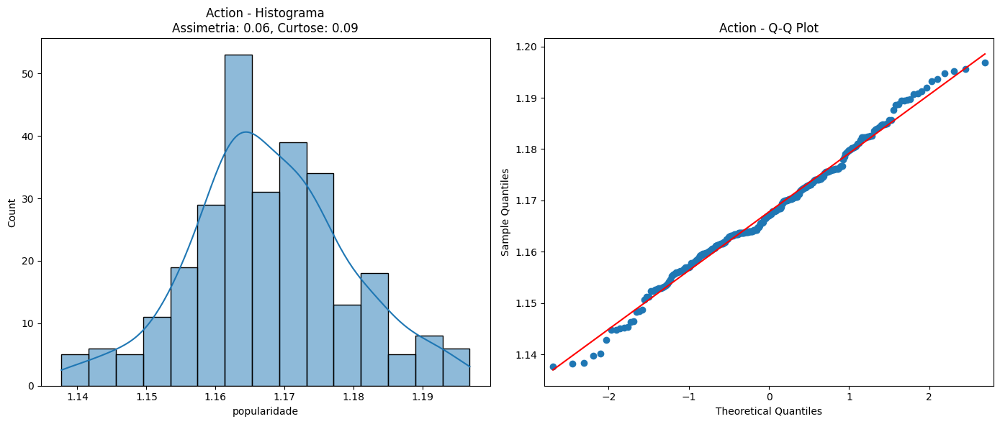

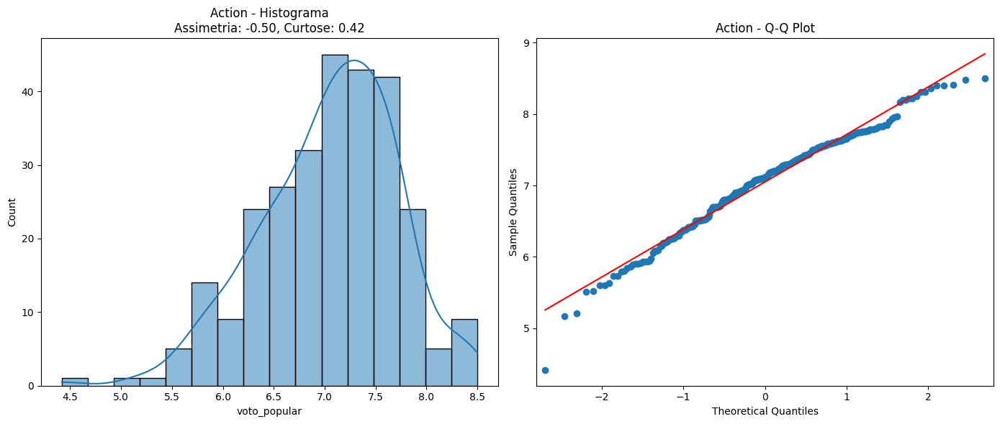

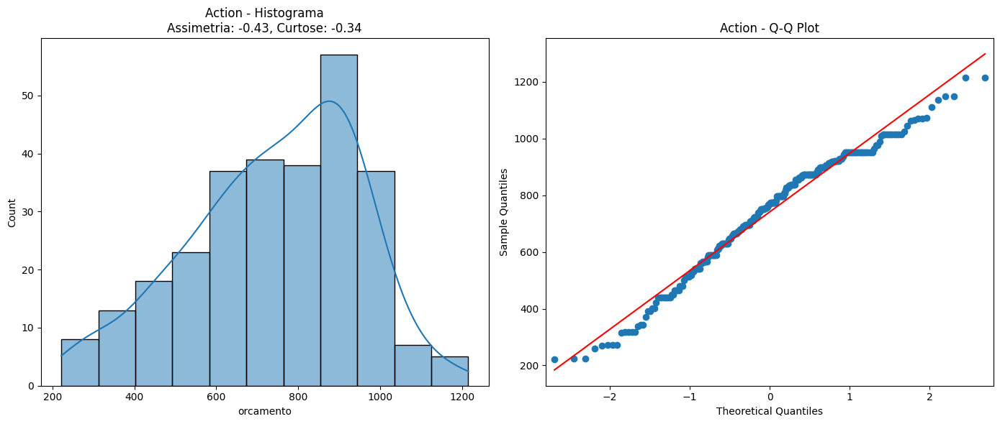

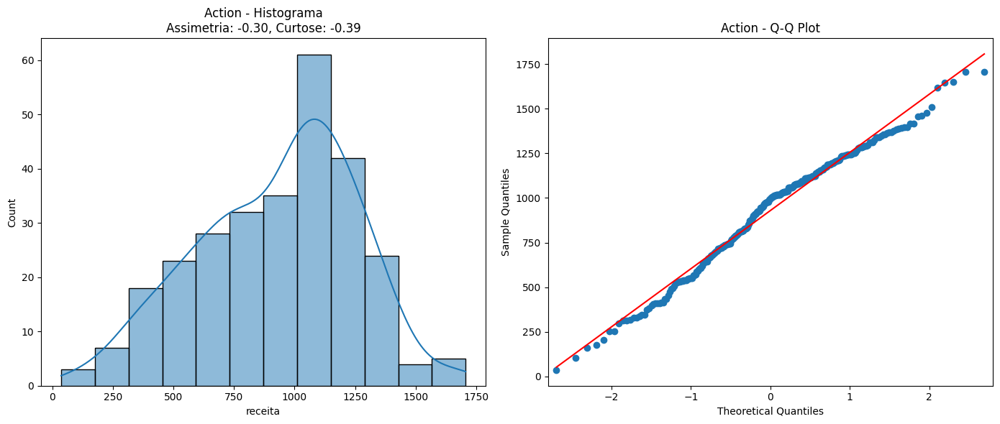

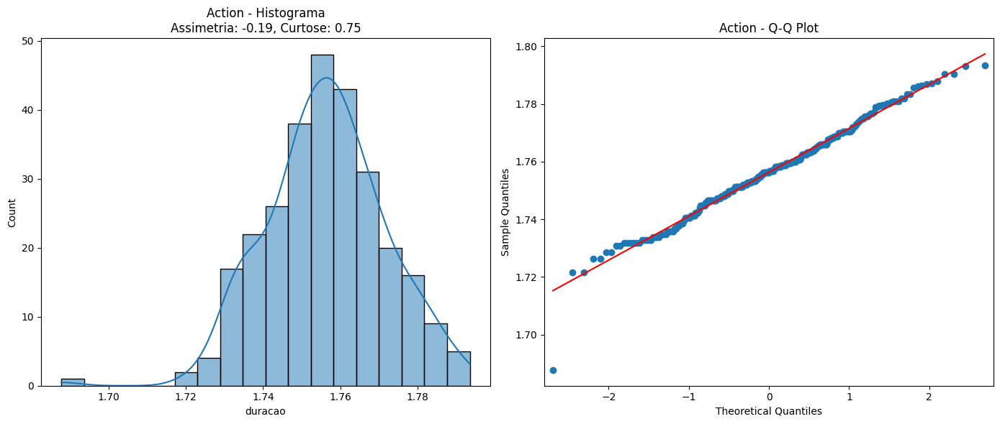

...

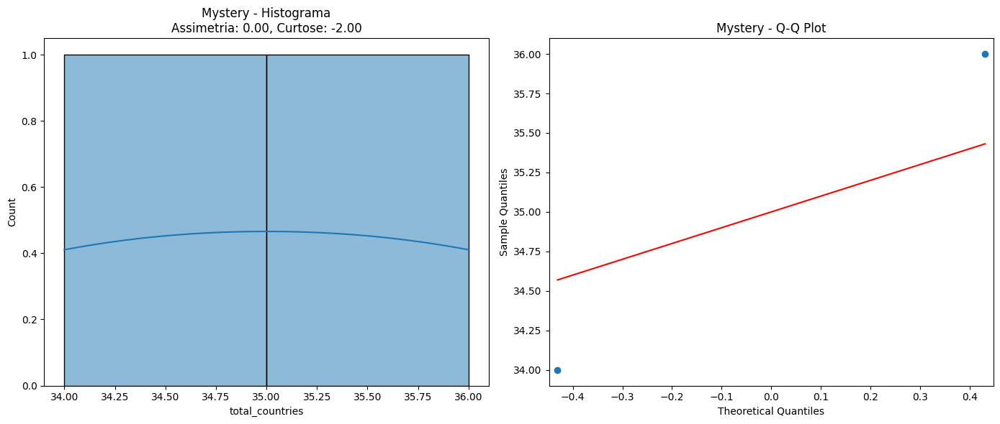

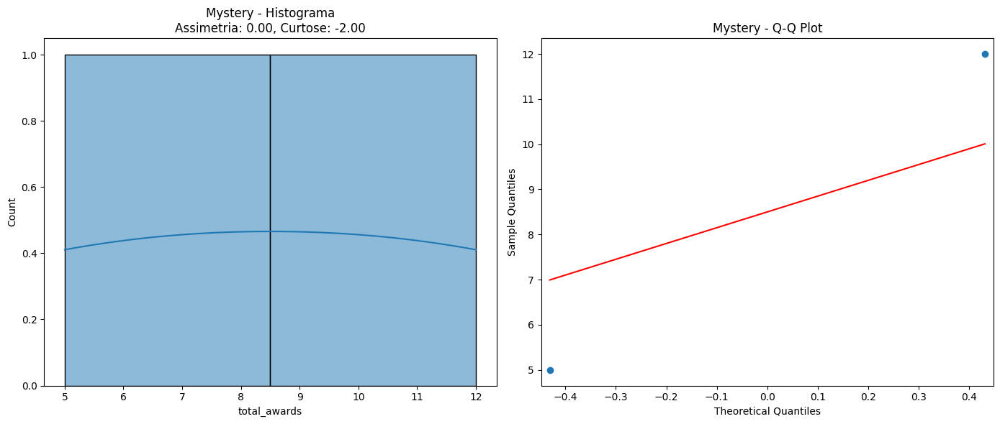

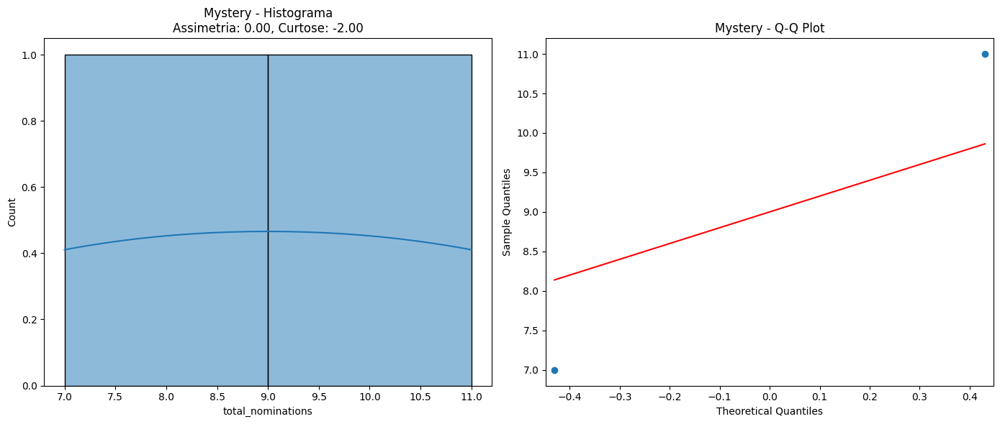

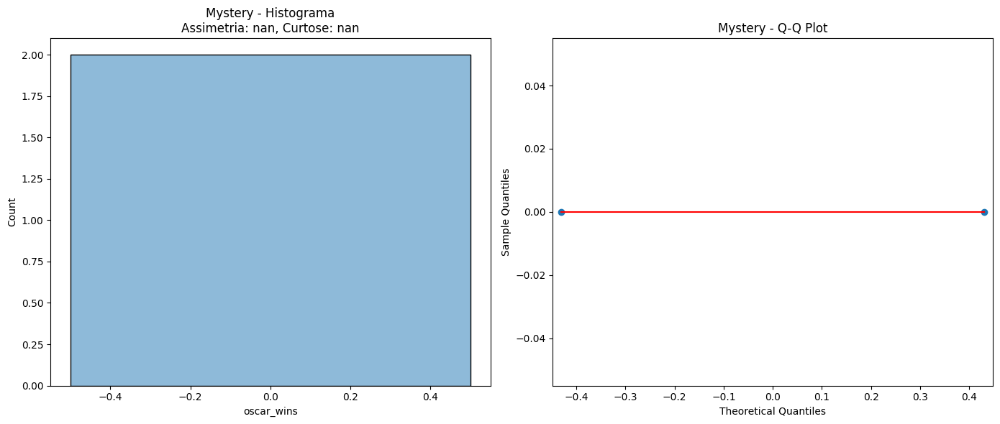

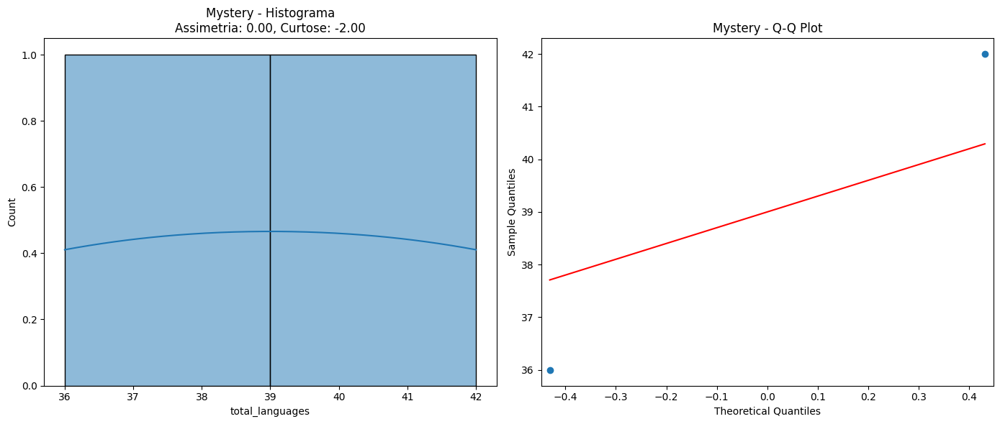

In [39]:
def normalAnalysis(data, column):
    skewness = skew(data[column])
    kurt = kurtosis(data[column], fisher=True) ##normal-kurtosis=0
    return skewness, kurt

def plot(data, column, category):
    skewness, kurt = normalAnalysis(data, column)
    _, axs = plt.subplots(1, 2, figsize=(14,6))
    sns.histplot(data[column], kde=True, ax=axs[0])
    axs[0].set_title(f'{category} - Histograma\nAssimetria: {skewness:.2f}, Curtose: {kurt:.2f}')
    sm.qqplot(data[column], line='s', ax=axs[1])
    axs[1].set_title(f'{category} - Q-Q Plot')
    plt.tight_layout()
    plt.show()

for category in Y.unique():
    for column in X.columns:
        aux = X[Y == category]
        plot(aux, column, category)